In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import dlib
import numpy as np
from tqdm import tqdm
import pandas as pd
import math
import random

In [2]:
def median(x):
    
    """Return a median of a numpy matrix

    Parameters:
    x (np.array): Numpy matrix to be computed

    Returns:
    float: Final median

    """
    m,n = x.shape
    middle = np.arange((m-1)>>1,(m>>1)+1)
    x = np.partition(x,middle,axis=0)
    return x[middle].median(axis=0)

def remove_outliers(data,thresh=5.0):  
    
    """Remove outliers by z-score method, you can find more information about the z-score outlier determination at 
    https://medium.com/clarusway/z-score-and-how-its-used-to-determine-an-outlier-642110f3b482

    Parameters:
    data (array): Array of float data
    thresh (float): Threshold 

    Returns:
    array: Resulting array

    """
    m = median(data)                            
    s = np.abs(data-m)                          
    return data[(s<median(s)*thresh).all(axis=1)]


def remove_outliers_quantile(df, sup_th, inf_th):
    
    """Remove outliers of an image using the quantile method, removing the x% higher values and y% lower values where
    x and y are the superior and inferior thresholds

    Parameters:
    df (pandas.DataFrame): Dataframe containing the image data, each columns must be a RGR or BGR channel
    sup_th (float): Superior percent limit in decimal form 
    inf_th (float): Inferior percent limit in decimal form 

    Returns:
    array: Resulting Blue channel
    array: Resulting Green channel
    array: Resulting Red channel

    """

    df_clean = df[((df['b'] < df['b'].quantile(sup_th)) & (df['b'] > df['b'].quantile(inf_th))) &      ((df['g'] < df['g'].quantile(sup_th)) & (df['g'] > df['g'].quantile(inf_th))) &      ((df['r'] < df['r'].quantile(sup_th)) & (df['r'] > df['r'].quantile(inf_th)))]

    b_clean = df_clean['b'].values
    g_clean = df_clean['g'].values
    r_clean = df_clean['r'].values
    
    return b_clean, g_clean, r_clean


def face_detection(img, face_detector, landmark_detector):
    
    
    """Detect faces, extract the face from image using dlib landmarks

    Parameters:
    img (np.Array): Image matrix
    face_detector (_dlib_pybind11.fhog_object_detector): Dlib face classifier
    landmark_detector (_dlib_pybind11.shape_predictor): Dlib landmarks classifier 

    Returns:
    _dlib_pybind11.rectangles: Dlib rectangles containing faces
    array: Resulting image with the isolated face on a black background

    """
    
    # Detect the face using dlib
    faces = face_detector(img, 1)
    
    
    # In this part, we will iterate over all landmarks of interest and store into a list
    landmark_tuple = []
    for k, d in enumerate(faces):
        landmarks = landmark_detector(img, d)
        for n in range(0, 81):
            x = landmarks.part(n).x
            y = landmarks.part(n).y
            landmark_tuple.append((x, y))

    routes = []

    for i in range(15, -1, -1):
        from_coordinate = landmark_tuple[i+1]
        to_coordinate = landmark_tuple[i]
        routes.append(from_coordinate)

    from_coordinate = landmark_tuple[0]
    to_coordinate = landmark_tuple[17]
    routes.append(from_coordinate)

    for i in range(17, 20):
        from_coordinate = landmark_tuple[i]
        to_coordinate = landmark_tuple[i+1]
        routes.append(from_coordinate)

    from_coordinate = landmark_tuple[19]
    to_coordinate = landmark_tuple[24]
    routes.append(from_coordinate)

    for i in range(24, 26):
        from_coordinate = landmark_tuple[i]
        to_coordinate = landmark_tuple[i+1]
        routes.append(from_coordinate)

    from_coordinate = landmark_tuple[26]
    to_coordinate = landmark_tuple[16]
    routes.append(from_coordinate)
    routes.append(to_coordinate)
    
    routes.append(landmark_tuple[0])
    routes.append(landmark_tuple[77])
    routes.append(landmark_tuple[68])
    routes.append(landmark_tuple[70])
    routes.append(landmark_tuple[72])
    routes.append(landmark_tuple[73])



    for i in range(0, len(routes)-1):
        from_coordinate = routes[i]
        to_coordinate = routes[i+1]

    # Creat a mask and insert the face into it
    mask = np.zeros((img.shape[0], img.shape[1]))
    mask = cv2.fillConvexPoly(mask, np.array(routes), 1)
    mask = mask.astype(bool)

    out = np.zeros_like(img)
    out[mask] = img[mask]
    
    return out, faces


def landmarks_detection(ac, faces, landmark_detector, out):
    
    img = ac.copy()
    
    """Detect and cover the eyes, mouth and eyebrows based on dlib landmarks

    Parameters:
    ac (np.Array): Image matrix
    faces (_dlib_pybind11.rectangles): Dlib faces rectangles
    landmark_detector (_dlib_pybind11.shape_predictor): Dlib landmarks classifier 
    out (np.Array): Isolated face on a black background

    Returns:
    np.Array: Resulting image with eyes, eyebrows and mouth covered

    """
    # In this case, we have several landmarks, we will create a list for each of them
    right_eye = []
    left_eye = []
    mouth = []
    r_eyeB = []
    l_eyeB = []

    # Iterate over all interest landmarks
    for k, d in enumerate(faces):
        landmarks = landmark_detector(img, d)
        for n in range(36, 42):
            x = landmarks.part(n).x
            y = landmarks.part(n).y
            right_eye.append((x, y))
        #    cv2.circle(ac, (x, y), 2, (255, 255, 0), -1)

        for n in range(42, 48):
            x = landmarks.part(n).x
            y = landmarks.part(n).y
            left_eye.append((x, y))
        #    cv2.circle(ac, (x, y), 2, (255, 255, 0), -1)

        for n in range(48, 68):
            x = landmarks.part(n).x
            y = landmarks.part(n).y
            mouth.append((x, y))
         #   cv2.circle(img, (x, y), 2, (255, 255, 0), -1)

        for n in range(17, 22):
            x = landmarks.part(n).x
            y = landmarks.part(n).y
            r_eyeB.append((x, y))

        for n in range(22, 27):
            x = landmarks.part(n).x
            y = landmarks.part(n).y
            l_eyeB.append((x, y))

    # Create a mask and insert the landmarks into it
    mask = np.zeros((img.shape[0], img.shape[1]))
    mask = cv2.fillConvexPoly(mask, np.array(left_eye), 1)
    mask = cv2.fillConvexPoly(mask, np.array(right_eye), 1)
    mask = cv2.fillConvexPoly(mask, np.array(mouth), 1)
    mask = cv2.fillConvexPoly(mask, np.array(r_eyeB), 1)
    mask = cv2.fillConvexPoly(mask, np.array(l_eyeB), 1)


    mask = mask.astype(bool)
    mask = ~mask

    out_lm = np.zeros_like(out)
    out_lm[mask] = out[mask]
    return out_lm

# Extract only the skin pixels
def clean_skin_pixels(out_lm):
    
    """Remove the non-skin pixels from image matrix

    Parameters:
    out_lm (np.Array): Image matrix

    Returns:
    np.Array: Blue clannel with only skin pixels
    np.Array: Green clannel with only skin pixels
    np.Array: Red clannel with only skin pixels

    """

    b = out_lm[:,:,0].flatten()
    g = out_lm[:,:,1].flatten()
    r = out_lm[:,:,2].flatten()

    b_clean = []
    g_clean = []
    r_clean = []

    for i in range(0, len(b) - 1):
        if b[i] != 0 and g[i] != 0 and r[i] != 0:
            b_clean.append(b[i])
            g_clean.append(g[i])
            r_clean.append(r[i])
            
    return b_clean, g_clean, r_clean


def create_blank_image(b_mean, g_mean, r_mean, dim = 150):
    """Create a blank squared 150,150 image with given BRG colors 
    
    Parameters:
    b_mean (float): Blue value of image
    g_mean (float): Green value of image
    r_mean (float): Red value of image

    Returns:
    np.Array: 150x150 blank image with the given BGR color

    """
    
    
    blank_image = np.zeros((dim, dim, 3), np.uint8)
    blank_image[:,:,:] = (b_mean, g_mean, r_mean)
    #cv2.putText(blank_image, 'Mean', (10, 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2, cv2.LINE_AA)
    
    return blank_image


# Return df containing colors except the black pixels
def colors_df(out_lm):
    """Remove the non-skin pixels from image matrix using pandas data frame

    Parameters:
    out_lm (np.Array): Image matrix, must be in BGR format

    Returns:
    pandas.DataFrame: Data frame containing BGR channels with only skin pixels 

    """
    
    
    b = out_lm[:,:,0].flatten()
    g = out_lm[:,:,1].flatten()
    r = out_lm[:,:,2].flatten()


    df = pd.DataFrame({'b': b, 'g': g, 'r': r})

    return df


def detect_skin_color(img, face_detector, landmark_detector):
    
    out, faces = face_detection(img, face_detector, landmark_detector)
    out_lm = landmarks_detection(img, faces, landmark_detector, out)


    # Remove non-skin pixels
    df = colors_df(out_lm)

    # Remove outliers (10% higher and lower values)
    b_clean, g_clean, r_clean = remove_outliers_quantile(df, .9, .1)

    # Get the mean value of each channel
    b_mean = np.mean(b_clean)
    g_mean = np.mean(g_clean)
    r_mean = np.mean(r_clean)

    # Create the rectangle with the final skin color
    square_size = 400
    blank_image = create_blank_image(b_mean, g_mean, r_mean, 10)
    
    return r_mean, g_mean, b_mean, blank_image

def k_nearest_neighborhood_RGB(df, r, g, b, k):
    distances = np.sqrt((df['R'] - r) ** 2 + (df['G'] - g) ** 2 + (df['B'] - b) ** 2)
    
    closest_indices = distances.nsmallest(k).index
    
    return closest_indices

In [3]:
face_detector = dlib.get_frontal_face_detector()
landmark_detector = dlib.shape_predictor('shape_predictor_81_face_landmarks.dat')

## Base undertones
Source: https://www.lavenderhillclothing.com/blogs/lavenderhilllife/unlocking-the-power-of-colour-dressing-for-your-skin-tone#:~:text=There%20are%20several%20hues%20that,or%20blush%20and%20pink%20undertones

In [4]:
colors_undertones = [
    {"R": 246, "G": 212, "B": 185, "Undertone": "Warm"},
    {"R": 224, "G": 185, "B": 151, "Undertone": "Warm"},
    {"R": 217, "G": 178, "B": 140, "Undertone": "Warm"},
    {"R": 203, "G": 133, "B": 88, "Undertone": "Warm"}, 
    {"R": 180, "G": 120, "B": 88, "Undertone": "Warm"}, 
    {"R": 150, "G": 97, "B": 76, "Undertone": "Warm"}, 
    {"R": 85, "G": 45, "B": 35, "Undertone": "Warm"}, 
    {"R": 96, "G": 50, "B": 30, "Undertone": "Neutral"}, 
    {"R": 160, "G": 112, "B": 76, "Undertone": "Neutral"}, 
    {"R": 188, "G": 128, "B": 95, "Undertone": "Neutral"}, 
    {"R": 189, "G": 143, "B": 106, "Undertone": "Neutral"}, 
    {"R": 205, "G": 152, "B": 119, "Undertone": "Neutral"}, 
    {"R": 222, "G": 186, "B": 160, "Undertone": "Neutral"}, 
    {"R": 244, "G": 215, "B": 194, "Undertone": "Neutral"}, 
    {"R": 85, "G": 53, "B": 39, "Undertone": "Cool"}, 
    {"R": 101, "G": 56, "B": 41, "Undertone": "Cool"}, 
    {"R": 182, "G": 124, "B": 82, "Undertone": "Cool"}, 
    {"R": 214, "G": 169, "B": 141, "Undertone": "Cool"}, 
    {"R": 240, "G": 202, "B": 177, "Undertone": "Cool"}, 
    {"R": 223, "G": 188, "B": 161, "Undertone": "Cool"}, 
    {"R": 227, "G": 201, "B": 185, "Undertone": "Cool"} 
]

df_undertones = pd.DataFrame(colors_undertones)

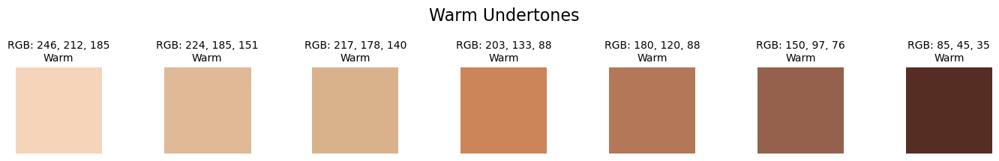

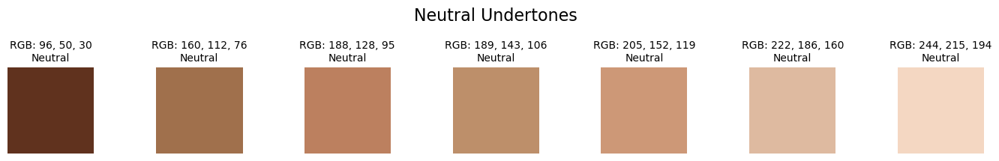

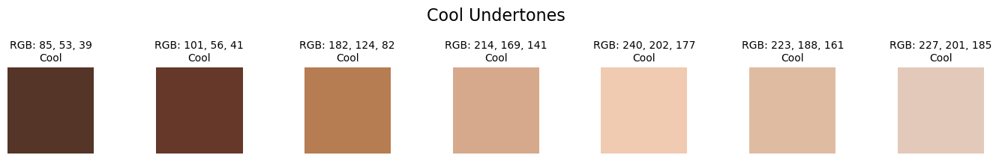

In [5]:
warm_colors = [color for color in colors_undertones if color["Undertone"] == "Warm"]
neutral_colors = [color for color in colors_undertones if color["Undertone"] == "Neutral"]
cool_colors = [color for color in colors_undertones if color["Undertone"] == "Cool"]

def plot_colors(colors, title):
    fig, ax = plt.subplots(1, len(colors), figsize=(len(colors) * 2, 2))
    for idx, color in enumerate(colors):
        rgb = (color["R"]/255, color["G"]/255, color["B"]/255)
        ax[idx].imshow([[rgb]])
        ax[idx].axis('off')
        ax[idx].set_title(f'RGB: {color["R"]}, {color["G"]}, {color["B"]}\n{color["Undertone"]}', fontsize=10)
    
    fig.suptitle(title, fontsize=16, y=1.05)  
    plt.tight_layout()
    fig.subplots_adjust(top=0.65)
    
plot_colors(warm_colors, 'Warm Undertones')
plot_colors(neutral_colors, 'Neutral Undertones')
plot_colors(cool_colors, 'Cool Undertones')

In [6]:
df_undertones.to_dict()

{'R': {0: 246,
  1: 224,
  2: 217,
  3: 203,
  4: 180,
  5: 150,
  6: 85,
  7: 96,
  8: 160,
  9: 188,
  10: 189,
  11: 205,
  12: 222,
  13: 244,
  14: 85,
  15: 101,
  16: 182,
  17: 214,
  18: 240,
  19: 223,
  20: 227},
 'G': {0: 212,
  1: 185,
  2: 178,
  3: 133,
  4: 120,
  5: 97,
  6: 45,
  7: 50,
  8: 112,
  9: 128,
  10: 143,
  11: 152,
  12: 186,
  13: 215,
  14: 53,
  15: 56,
  16: 124,
  17: 169,
  18: 202,
  19: 188,
  20: 201},
 'B': {0: 185,
  1: 151,
  2: 140,
  3: 88,
  4: 88,
  5: 76,
  6: 35,
  7: 30,
  8: 76,
  9: 95,
  10: 106,
  11: 119,
  12: 160,
  13: 194,
  14: 39,
  15: 41,
  16: 82,
  17: 141,
  18: 177,
  19: 161,
  20: 185},
 'Undertone': {0: 'Warm',
  1: 'Warm',
  2: 'Warm',
  3: 'Warm',
  4: 'Warm',
  5: 'Warm',
  6: 'Warm',
  7: 'Neutral',
  8: 'Neutral',
  9: 'Neutral',
  10: 'Neutral',
  11: 'Neutral',
  12: 'Neutral',
  13: 'Neutral',
  14: 'Cool',
  15: 'Cool',
  16: 'Cool',
  17: 'Cool',
  18: 'Cool',
  19: 'Cool',
  20: 'Cool'}}

## Colors recommendated for each undertone
Source: https://fashionterminologies.com/the-best-colors-for-womens-clothing-based-on-your-undertone/

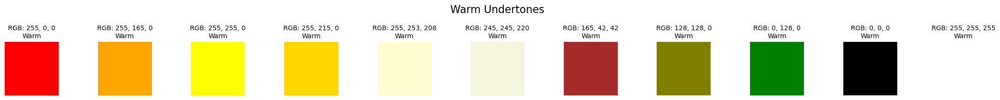

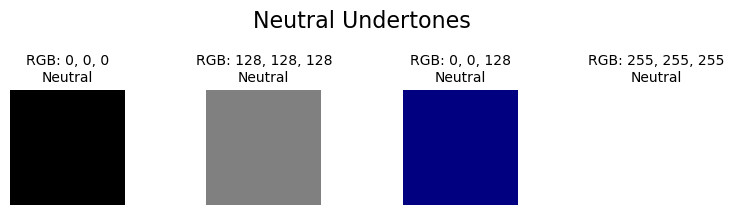

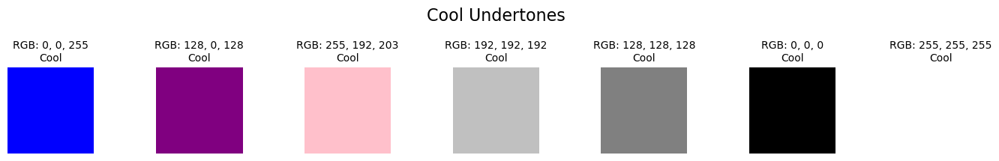

In [7]:
colors_for_undertones = [
    {"Undertone": "Warm", "Color": "Red", "R": 255, "G": 0, "B": 0},
    {"Undertone": "Warm", "Color": "Orange", "R": 255, "G": 165, "B": 0},
    {"Undertone": "Warm", "Color": "Yellow", "R": 255, "G": 255, "B": 0},
    {"Undertone": "Warm", "Color": "Gold", "R": 255, "G": 215, "B": 0},
    {"Undertone": "Warm", "Color": "Cream", "R": 255, "G": 253, "B": 208},
    {"Undertone": "Warm", "Color": "Beige", "R": 245, "G": 245, "B": 220},
    {"Undertone": "Warm", "Color": "Brown", "R": 165, "G": 42, "B": 42},
    {"Undertone": "Warm", "Color": "Olive", "R": 128, "G": 128, "B": 0},
    {"Undertone": "Warm", "Color": "Green", "R": 0, "G": 128, "B": 0},
    {"Undertone": "Warm", "Color": "Black", "R": 0, "G": 0, "B": 0},
    {"Undertone": "Warm", "Color": "White", "R": 255, "G": 255, "B": 255},
    
    {"Undertone": "Cool", "Color": "Blue", "R": 0, "G": 0, "B": 255},
    {"Undertone": "Cool", "Color": "Purple", "R": 128, "G": 0, "B": 128},
    {"Undertone": "Cool", "Color": "Pink", "R": 255, "G": 192, "B": 203},
    {"Undertone": "Cool", "Color": "Silver", "R": 192, "G": 192, "B": 192},
    {"Undertone": "Cool", "Color": "Gray", "R": 128, "G": 128, "B": 128},
    {"Undertone": "Cool", "Color": "Black", "R": 0, "G": 0, "B": 0},
    {"Undertone": "Cool", "Color": "White", "R": 255, "G": 255, "B": 255},
    
    {"Undertone": "Neutral", "Color": "Black", "R": 0, "G": 0, "B": 0},
    {"Undertone": "Neutral", "Color": "Gray", "R": 128, "G": 128, "B": 128},
    {"Undertone": "Neutral", "Color": "Navy Blue", "R": 0, "G": 0, "B": 128},
    {"Undertone": "Neutral", "Color": "White", "R": 255, "G": 255, "B": 255}
]

warm_colors = [color for color in colors_for_undertones if color["Undertone"] == "Warm"]
neutral_colors = [color for color in colors_for_undertones if color["Undertone"] == "Neutral"]
cool_colors = [color for color in colors_for_undertones if color["Undertone"] == "Cool"]

df_color_for_undertone = pd.DataFrame(colors_for_undertones)

plot_colors(warm_colors, 'Warm Undertones')
plot_colors(neutral_colors, 'Neutral Undertones')
plot_colors(cool_colors, 'Cool Undertones')

# <center> Extracting the skincolor </center>

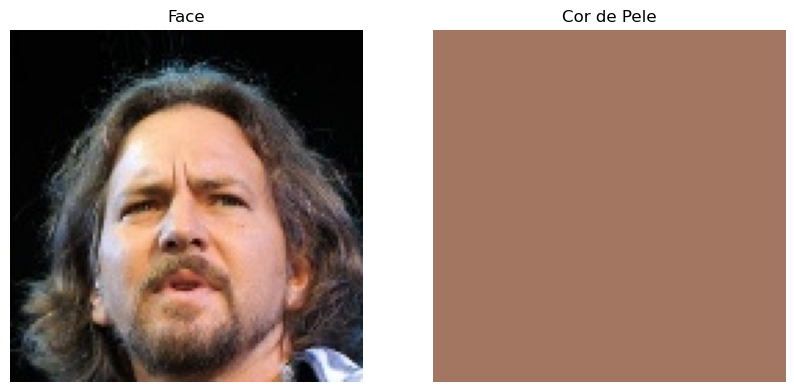

In [8]:
img = cv2.cvtColor(cv2.imread('000020.jpg'), cv2.COLOR_BGR2RGB)

r, g, b, color_image = detect_skin_color(img, face_detector, landmark_detector)
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Face')
plt.imshow(img)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Cor de Pele')
plt.imshow(color_image)
plt.axis('off')

plt.show()

# <center> Finding the undertone based on R, G and B values of skin color using euclidian distance </center>

In [9]:
closest_indices = k_nearest_neighborhood_RGB(df_undertones, r, g, b, 1)
r_undertone, g_undertone, b_undertone, undertone  = [tuple(df_undertones.loc[idx, ['R', 'G', 'B', 'Undertone']]) for idx in closest_indices][0]
print(f"Undertone: {undertone}, R: {r_undertone}, G: {g_undertone}, B: {b_undertone}")

Undertone: Warm, R: 150, G: 97, B: 76


# <center> Finding the colors for the undetone </center>

In [10]:
display(df_color_for_undertone.loc[df_color_for_undertone['Undertone'] == undertone, ['Color', 'R', 'G', 'B']])

,Color,R,G,B
0,Red,255,0,0
1,Orange,255,165,0
2,Yellow,255,255,0
3,Gold,255,215,0
4,Cream,255,253,208
5,Beige,245,245,220
6,Brown,165,42,42
7,Olive,128,128,0
8,Green,0,128,0
9,Black,0,0,0


## Randomly selecting three colors

In [11]:
selected_colors = df_color_for_undertone.loc[df_color_for_undertone['Undertone'] == undertone, ['R', 'G', 'B', 'Color']].sample(3)

display(selected_colors)

,R,G,B,Color
0,255,0,0,Red
10,255,255,255,White
3,255,215,0,Gold


## Selecting the clothes

In [12]:
df_clothes = pd.read_csv('clothes.csv')
df_clothes = df_clothes.rename(columns = {"R_median": "R", "G_median": "G", "B_median": "B"})


print("Classes de roupa:", df_clothes['clothes_class'].unique())

Classes de roupa: ['skirt' 'longsleeve' 'dress' 'pants' 't-shirt' 'shorts' 'hat' 'shoes'
 'shirt' 'outwear']


In [13]:
clothes_class = 'shirt'

df_clothes_class = df_clothes[df_clothes['clothes_class'] == clothes_class]

recommended_clothes = []

for selected_color in selected_colors[['R', 'G', 'B']].values:

    r_clothes, g_clothes, b_clothes,  = selected_color

    indexes_knn_clothes = k_nearest_neighborhood_RGB(df_clothes_class, r_clothes, g_clothes, b_clothes, 30)
    
    recommended_clothes_list = df_clothes_class.loc[indexes_knn_clothes, 'clothing_path'].to_list()
    
    recommended_clothes_list = random.sample(recommended_clothes_list, 1)

    recommended_clothes.append(recommended_clothes_list)
    
recommended_clothes = np.concatenate(recommended_clothes)

# <center> Result </center>

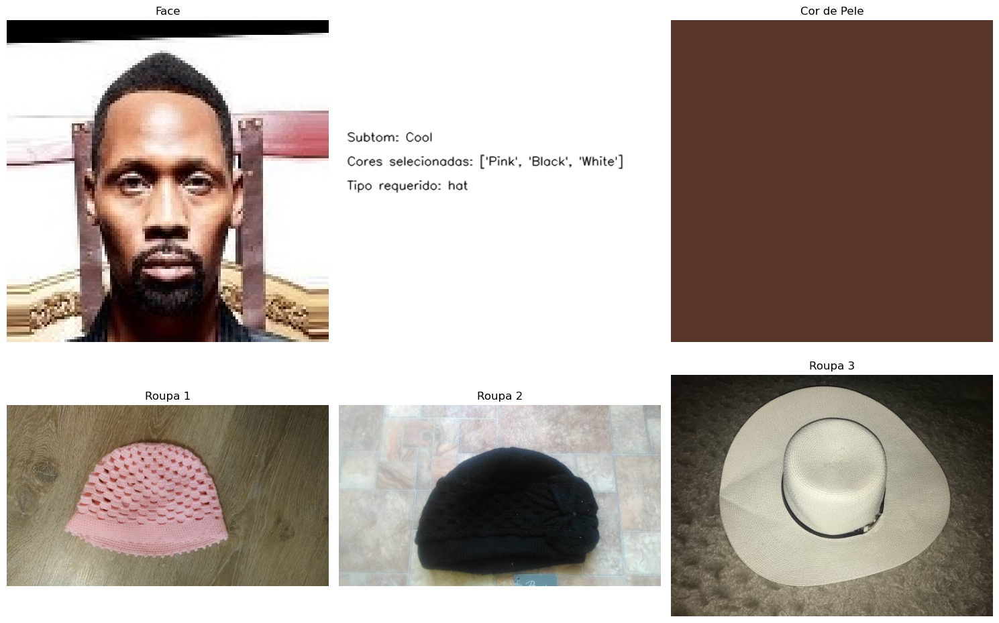

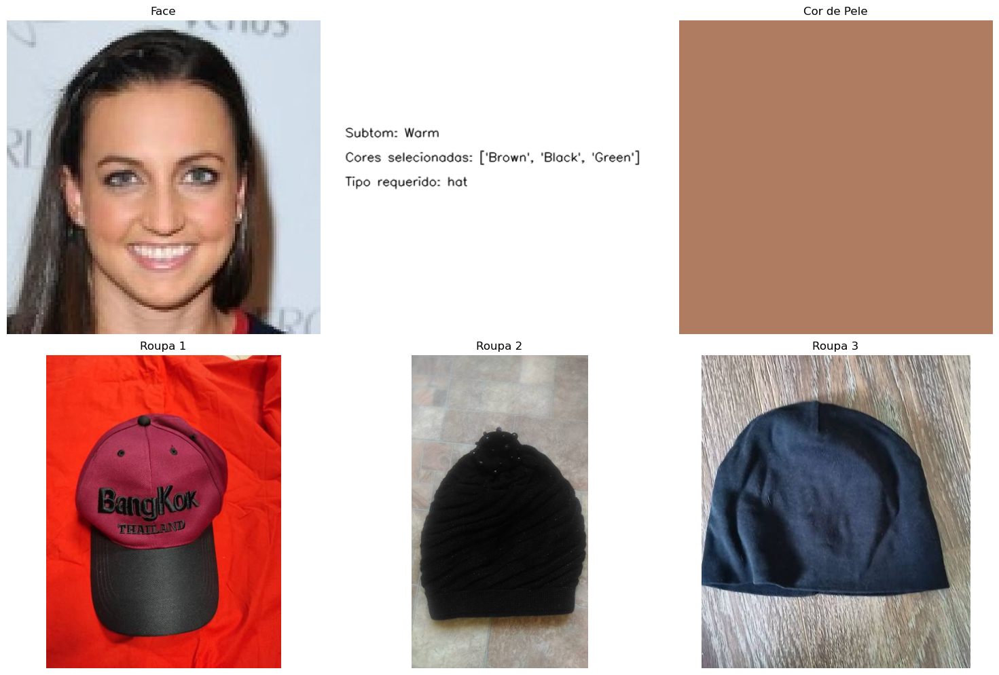

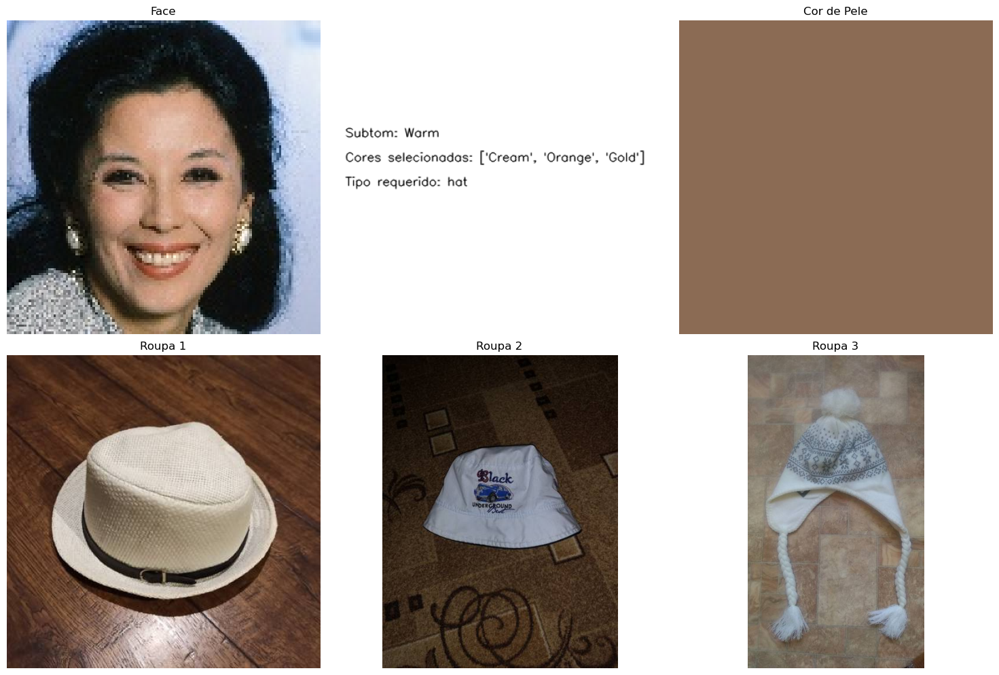

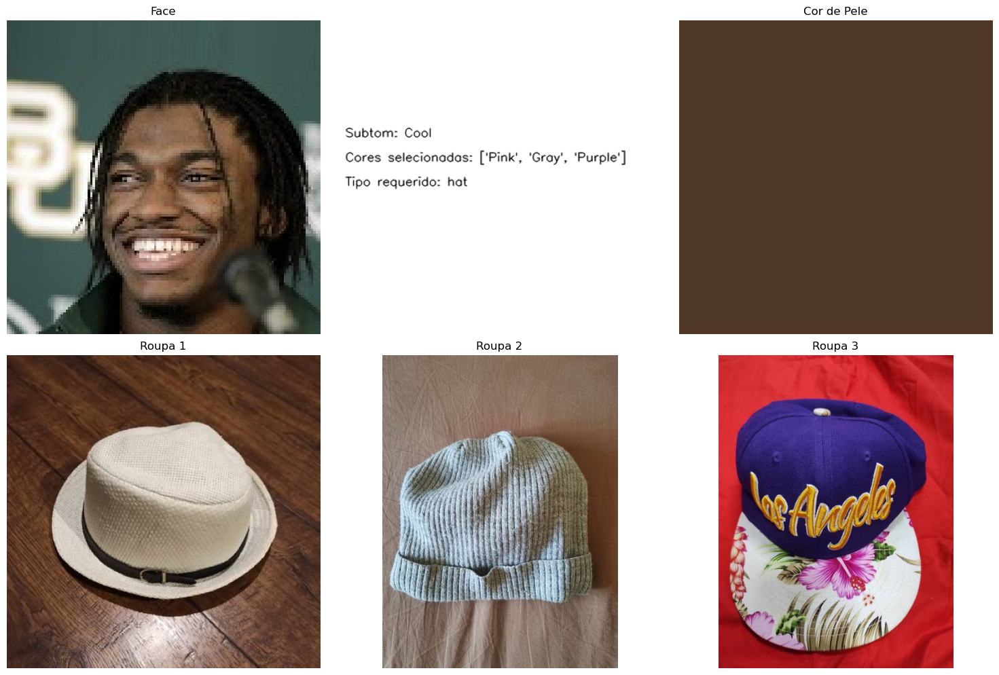

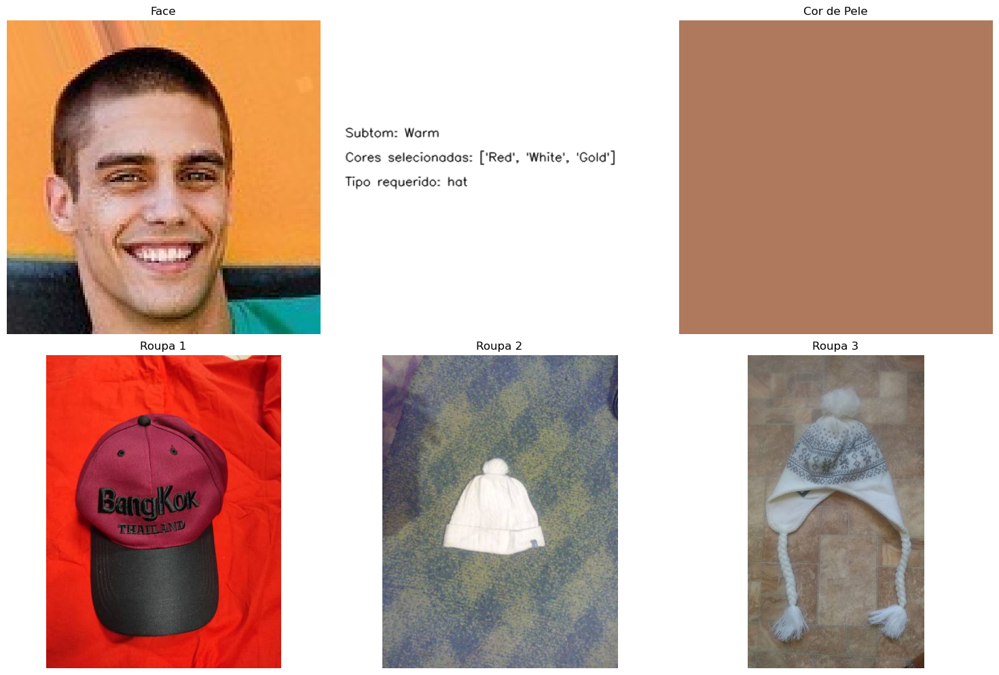

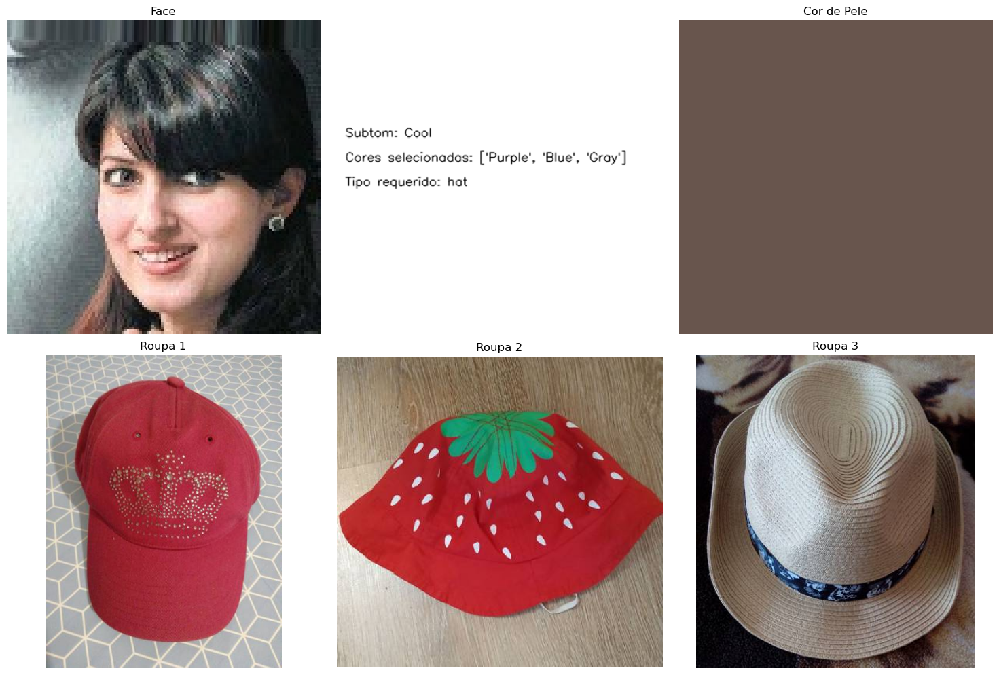

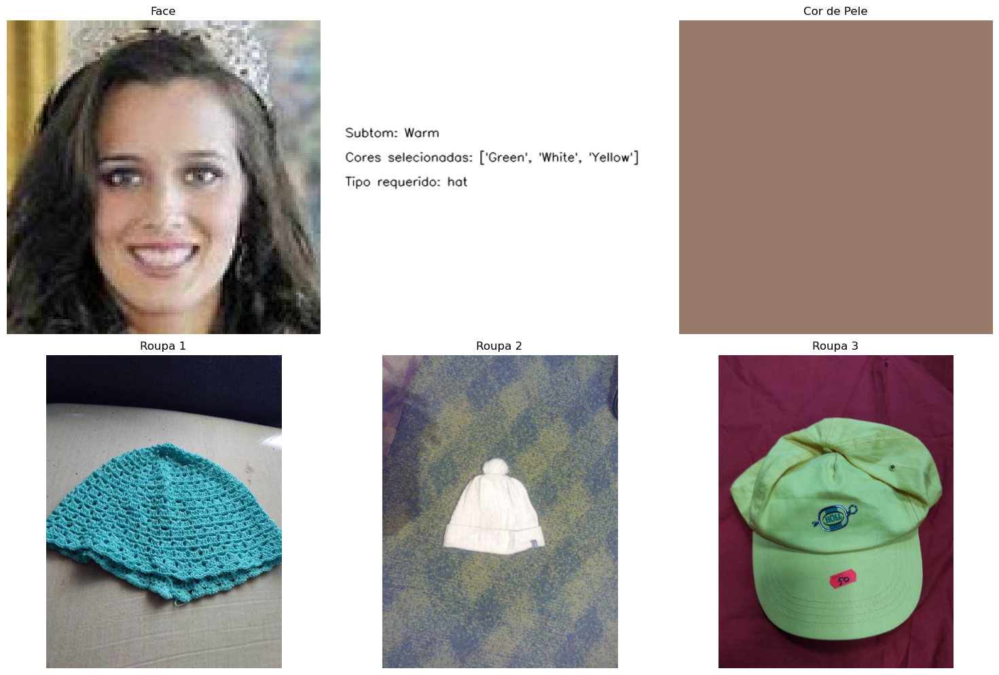

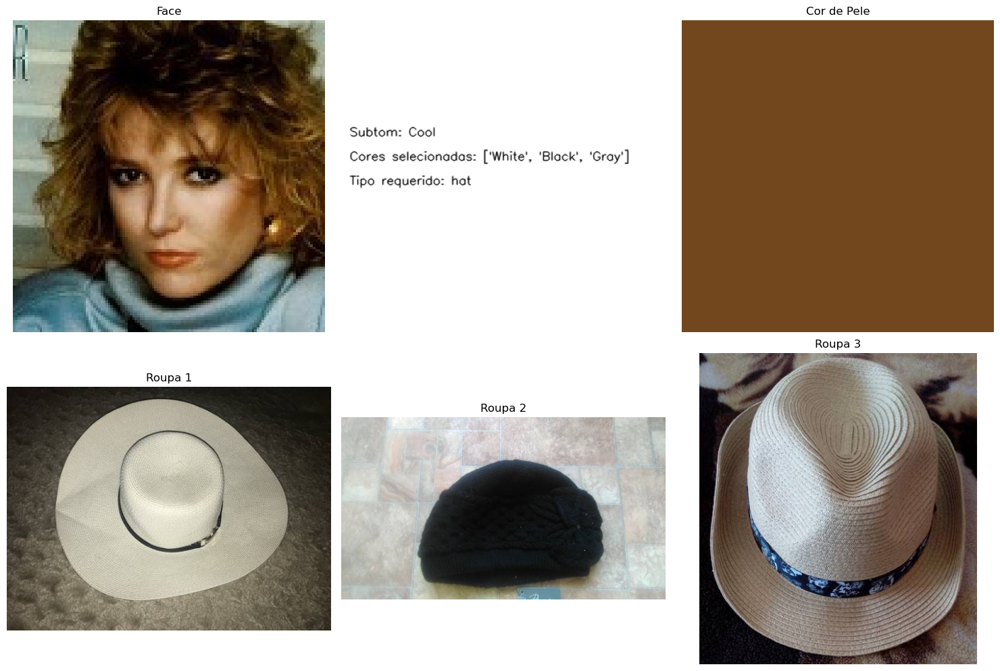

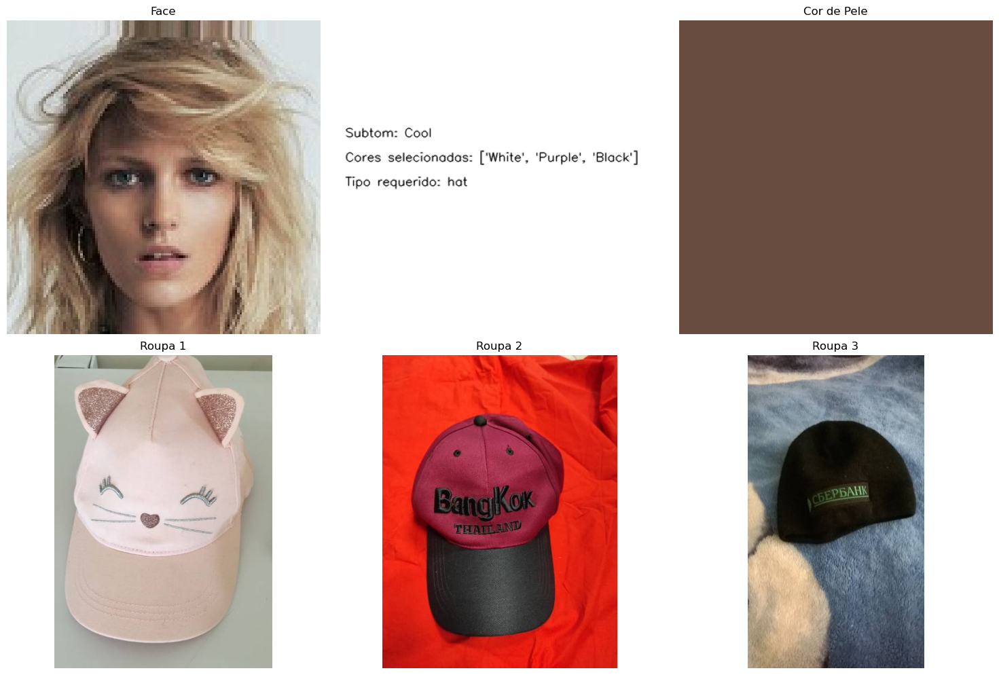

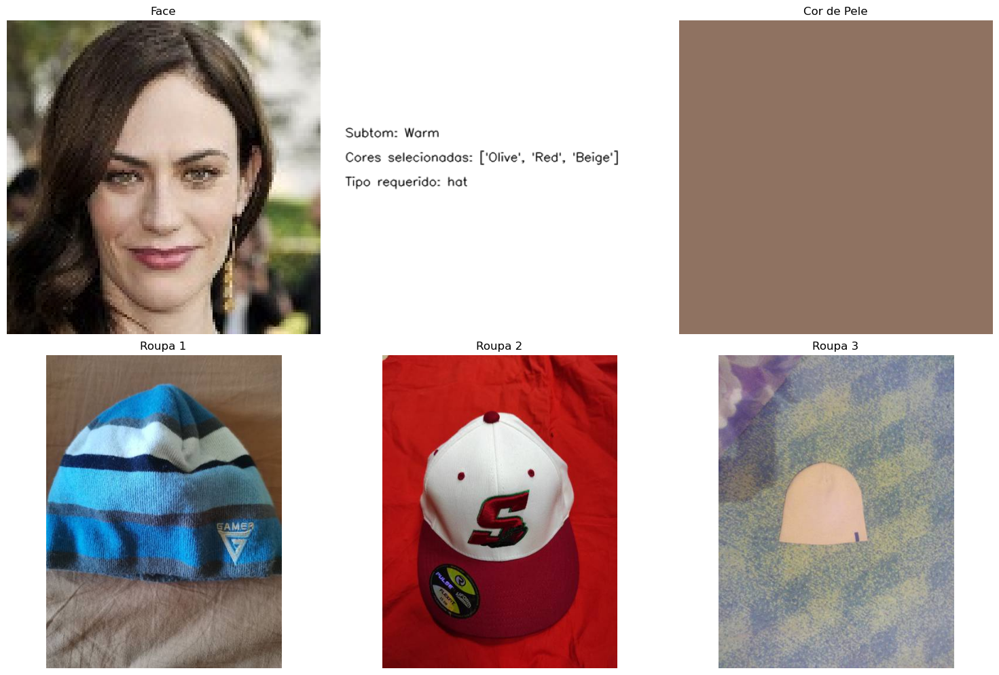

IndexError: list index out of range

In [14]:
def recommend_clothe(img_path):

    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    r, g, b, color_image = detect_skin_color(img, face_detector, landmark_detector)
    
    closest_indices = k_nearest_neighborhood_RGB(df_undertones, r, g, b, 1)
    df_undertone, g_undertone, b_undertone, undertone  = [tuple(df_undertones.loc[idx, ['R', 'G', 'B', 'Undertone']]) for idx in closest_indices][0]
    
    selected_colors = df_color_for_undertone.loc[df_color_for_undertone['Undertone'] == undertone, ['R', 'G', 'B', 'Color']].sample(3)

    df_clothes_class = df_clothes[df_clothes['clothes_class'] == clothes_class]

    recommended_clothes = []

    for selected_color in selected_colors[['R', 'G', 'B']].values:

        r_clothes, g_clothes, b_clothes,  = selected_color

        indexes_knn_clothes = k_nearest_neighborhood_RGB(df_clothes_class, r_clothes, g_clothes, b_clothes, 5)

        recommended_clothes_list = df_clothes_class.loc[indexes_knn_clothes, 'clothing_path'].to_list()

        recommended_clothes_list = random.sample(recommended_clothes_list, 1)

        recommended_clothes.append(recommended_clothes_list)

    recommended_clothes = np.concatenate(recommended_clothes)
    
    plt.figure(figsize=(15, 10))

    # First row: Face and Skin Color
    plt.subplot(2, 3, 1)
    plt.title('Face')
    plt.imshow(img)
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.title('Cor de Pele')
    plt.imshow(color_image)
    plt.axis('off')

    # Create an image with multiline text using cv2
    text_image = np.ones((200, 400, 3), dtype=np.uint8) * 255   # Create a black image
    font = cv2.FONT_HERSHEY_SIMPLEX
    text_lines = [
        f"Subtom: {undertone}",
        f"Cores selecionadas: {selected_colors['Color'].to_list()}",
        f"Tipo requerido: {clothes_class}"
    ]

    line_height = 30
    y = 50
    for line in text_lines:
        cv2.putText(text_image, line, (10, y), font, 0.5, (0, 0, 0), 1, cv2.LINE_AA)
        y += line_height

    # Display the text image in subplot (2, 3, 3)
    plt.subplot(2, 3, 2)
    plt.imshow(cv2.cvtColor(text_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    # Second row: Recommended Clothes
    for i, x in enumerate(recommended_clothes):
        plt.subplot(2, 3, i + 4)  # Start plotting from the 4th position in the grid
        plt.title(f'Roupa {i+1}')
        plt.imshow(cv2.cvtColor(cv2.imread(x), cv2.COLOR_BGR2RGB))
        plt.axis('off')

    plt.tight_layout()  # Adjust layout for better spacing
    plt.show()

folder_path = 'archive (5)/100k/100k/'
images_paths = [folder_path + i for i in os.listdir(folder_path) if '.jpg' in i]
clothes_class = 'hat'

for img_path in images_paths[:100]:
    recommend_clothe(img_path)

# <center> Result with inputing clothes class </center>

Selecione a classe de roupa
Classes de roupa disponíveis: ['skirt' 'longsleeve' 'dress' 'pants' 't-shirt' 'shorts' 'hat' 'shoes'
 'shirt' 'outwear']


Qual classe você quer a recomendação? dress


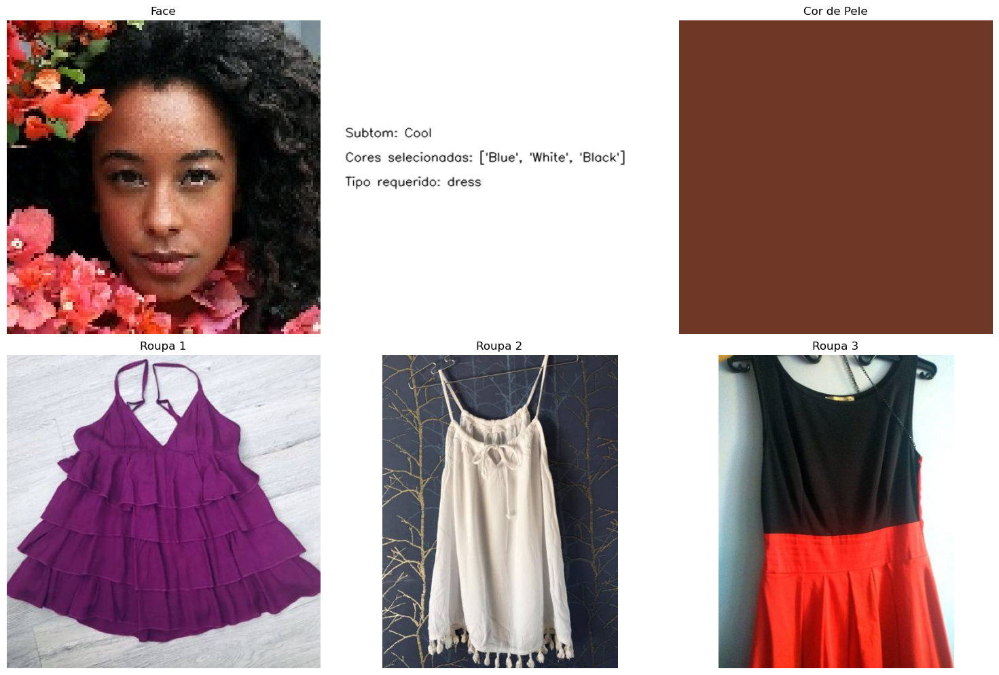

In [17]:
def recommend_clothe_v2(img_path, clothes_class):

    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    r, g, b, color_image = detect_skin_color(img, face_detector, landmark_detector)
    
    closest_indices = k_nearest_neighborhood_RGB(df_undertones, r, g, b, 1)
    df_undertone, g_undertone, b_undertone, undertone  = [tuple(df_undertones.loc[idx, ['R', 'G', 'B', 'Undertone']]) for idx in closest_indices][0]
    
    selected_colors = df_color_for_undertone.loc[df_color_for_undertone['Undertone'] == undertone, ['R', 'G', 'B', 'Color']].sample(3)
    
    df_clothes_class = df_clothes[df_clothes['clothes_class'] == clothes_class]

    recommended_clothes = []

    for selected_color in selected_colors[['R', 'G', 'B']].values:

        r_clothes, g_clothes, b_clothes,  = selected_color

        indexes_knn_clothes = k_nearest_neighborhood_RGB(df_clothes_class, r_clothes, g_clothes, b_clothes, 10)
        #print(selected_color)
        #display(df_clothes_class.loc[indexes_knn_clothes])
        recommended_clothes_list = df_clothes_class.loc[indexes_knn_clothes, 'clothing_path'].to_list()

        recommended_clothes_list = random.sample(recommended_clothes_list, 1)

        recommended_clothes.append(recommended_clothes_list)

    recommended_clothes = np.concatenate(recommended_clothes)
    
    plt.figure(figsize=(15, 10))

    # First row: Face and Skin Color
    plt.subplot(2, 3, 1)
    plt.title('Face')
    plt.imshow(img)
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.title('Cor de Pele')
    plt.imshow(color_image)
    plt.axis('off')

    # Create an image with multiline text using cv2
    text_image = np.ones((200, 400, 3), dtype=np.uint8) * 255   # Create a black image
    font = cv2.FONT_HERSHEY_SIMPLEX
    text_lines = [
        f"Subtom: {undertone}",
        f"Cores selecionadas: {selected_colors['Color'].to_list()}",
        f"Tipo requerido: {clothes_class}"
    ]

    line_height = 30
    y = 50
    for line in text_lines:
        cv2.putText(text_image, line, (10, y), font, 0.5, (0, 0, 0), 1, cv2.LINE_AA)
        y += line_height

    # Display the text image in subplot (2, 3, 3)
    plt.subplot(2, 3, 2)
    plt.imshow(cv2.cvtColor(text_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    # Second row: Recommended Clothes
    for i, x in enumerate(recommended_clothes):
        plt.subplot(2, 3, i + 4)  # Start plotting from the 4th position in the grid
        plt.title(f'Roupa {i+1}')
        plt.imshow(cv2.cvtColor(cv2.imread(x), cv2.COLOR_BGR2RGB))
        plt.axis('off')

    plt.tight_layout()  # Adjust layout for better spacing
    plt.show()
    
    
print("Selecione a classe de roupa")
print("Classes de roupa disponíveis:", df_clothes['clothes_class'].unique())
clothes_class = input("Qual classe você quer a recomendação?")

recommend_clothe_v2("000044.jpg", clothes_class)